# $/mu P$的两个显著的改变
 - 按层对Learning rate进行缩放
 - 更精准的初始化策略

### Motivation today
what is the best practices for scaling and hparam tuning LMs?
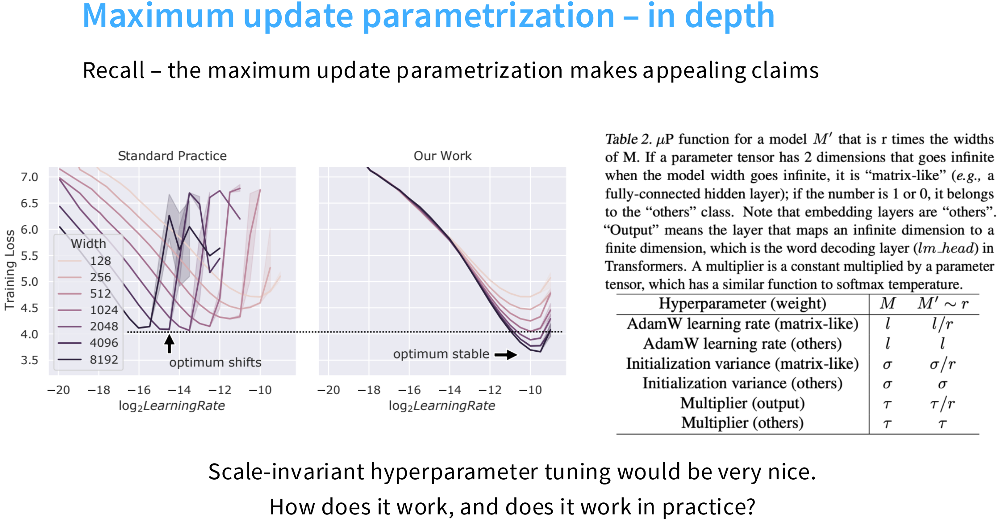
 - 左图讲的是在普通参数化模式的情况下，如果模型变大（宽度改变），那么需要调整学习率才能使得loss获得最优值
 - 右图讲的是在$\mu P$参数的策略下，无论模型宽度如何变化，最优学习率都能够保持稳定
     - 解决方法：
        右侧的表格进一步解释了$\mu$P是如何实现的。它展示了在$\mu P$下，当模型宽度从$M$变为$M'$时，不同超参数应该如何缩放。
        * 对于**矩阵类**的参数（如全连接层的权重），AdamW学习率和初始化方差都应该随着宽度$r$进行缩放（$\frac{l}{r}$和$\frac{\sigma}{r}$）。
        * 对于**非矩阵类**的参数（如词嵌入层），则无需缩放。
        * 此外，还有针对输出层的特定乘数（Multiplier）缩放规则。



# Recent models with detailed, public scaling recipes


## Cerebras-GPT
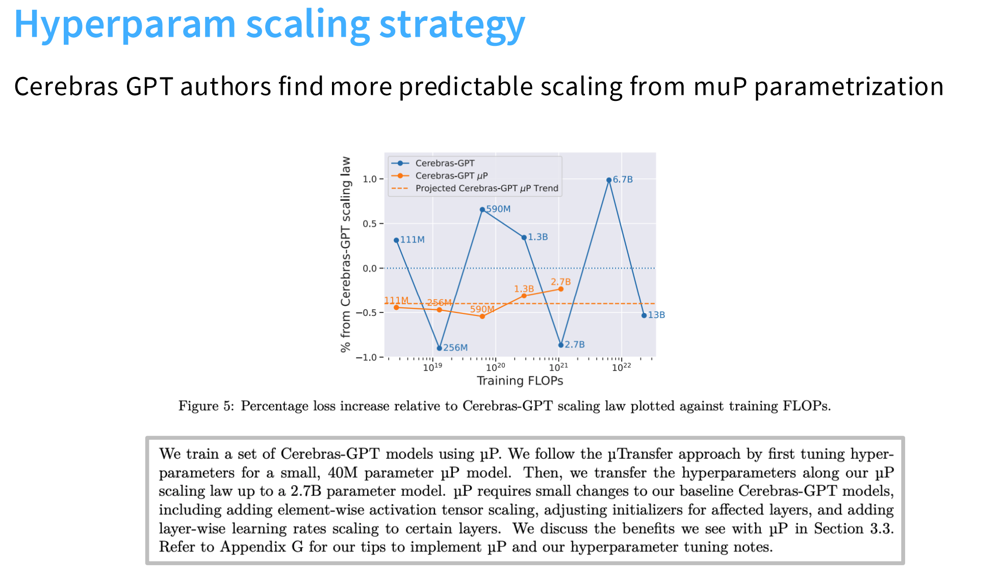
横轴是训练FLOPs（Training FLOPs），它代表了训练过程中所消耗的计算量，是衡量模型大小或训练规模的一个指标。FLOPs越高，模型通常越大。

纵轴是相对于Cerebras-GPT扩展定律的损失增加百分比（% from Cerebras-GPT scaling law）。

这听起来有点复杂，但可以理解为：一条理想的模型扩展规律会预示着，当你增加计算量时，损失会如何下降。这个纵轴衡量的是实际的损失与这条理想的扩展规律之间的偏差。

如果偏差接近于0（即在虚线附近），说明模型的性能扩展非常符合预期的规律，是可预测的。

如果偏差波动很大，说明扩展规律不那么稳定，不可预测。

 - 蓝色曲线（Cerebras-GPT）：这是未使用$\mu P$的传统Cerebras-GPT模型。你可以看到，随着计算量的增加，损失的偏差波动非常大，时高时低。例如，从590M到1.3B的损失偏差急剧下降，但从1.3B到2.7B又急剧上升，再到6.7B又大幅下降。这种剧烈的波动表明，模型的性能扩展不遵循平滑、可预测的规律。

 - 橙色曲线（Cerebras-GPT μP）：这是使用了$\mu P$参数化的Cerebras-GPT模型。这条曲线平滑得多，而且大部分点都更接近于0的虚线（Projected Cerebras-GPT μP Trend）。这表明，通过使用$\mu P$，模型的损失下降规律变得更加符合预期，即更可预测。


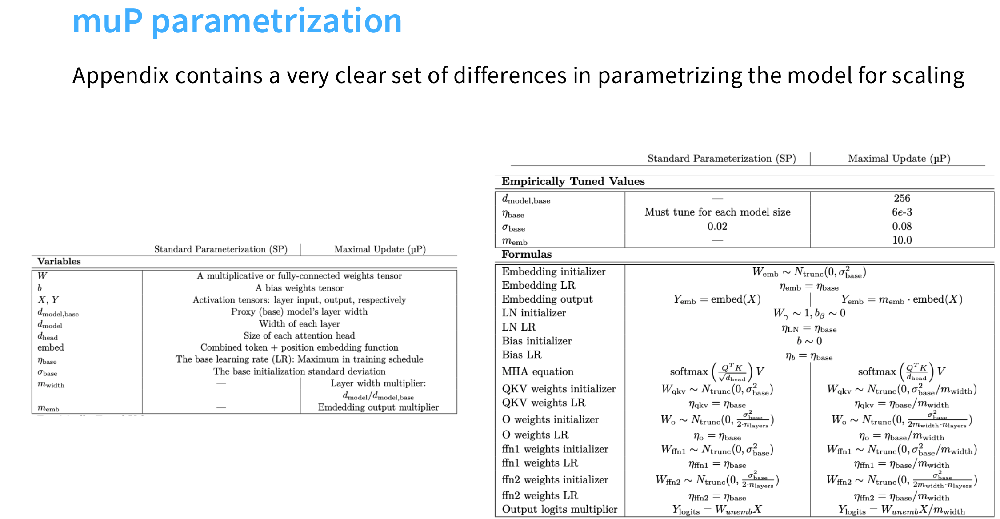
这是一张关于**$\mu$P (Maximum Update Parametrization)**参数化的技术细节图表。它主要通过对比**标准参数化（Standard Parameterization, SP）**和**最大更新参数化（Maximal Update, $\mu$P）**这两种方法，来展示在扩展模型时，不同变量和公式应如何设置。

这张图表的核心是展示**$\mu$P**如何通过改变模型参数和学习率的初始化及缩放规则，来实现其“超参数尺度不变性”的特性。

### 表格1：变量定义

左下角的表格定义了在公式中使用的变量符号，包括：
* $W$：权重（Weight）
* $b$：偏置（Bias）
* $X, Y$：输入与输出张量
* $d_{model, base}$：基础模型的维度
* $m_{width}$：宽度乘数（Width multiplier）
* $m_{emb}$：嵌入乘数（Embedding multiplier）
* $\eta_{base}$：基础学习率（The base learning rate）
* $\sigma_{base}$：基础初始化标准差（The base initialization standard deviation）

---

### 表格2：经验调优值（Empirically Tuned Values）

右上角的表格展示了在两种参数化方法下，一些**经验性调优的超参数值**。
* **Standard Parameterization (SP)**：
    * $d_{model, base}$ = 256
    * $\eta_{base}$ = 6e-3 (0.006)
    * $\sigma_{base}$ = 0.08
    * 值得注意的是，它在备注中明确指出：“**Must tune for each model size**”（必须为每一种模型大小单独调优）。这再次强调了标准参数化在模型扩展时的不便利性。
* **Maximal Update ($\mu$P)**：
    * $d_{model, base}$ = 256
    * $\eta_{base}$ = 10.0
    * $\sigma_{base}$ = 0.02
    * 这组值与标准参数化的值有显著不同，表明了**$\mu$P需要一套完全不同的超参数来获得最佳性能**。

---

### 表格3：公式（Formulas）

右下角的核心表格详细对比了两种参数化方法的**具体公式**，特别是关于初始化和学习率的设置。

* **Embedding (嵌入层)**：
    * **SP**: 嵌入权重用标准正态分布初始化，方差为$\sigma^2$。
    * **$\mu$P**: 嵌入权重也用正态分布初始化，但方差与$\eta_{base}$有关，且**其学习率（Embedding LR）在$\mu$P下被设置为$\eta_{base}$**。

* **MHA (多头注意力机制)**：
    * **SP**: $Q, K, V$ 权重初始化方差为 $\sigma_{base}^2$。
    * **$\mu$P**: $Q, K, V$ 权重的初始化方差被**除以$\sqrt{m_{width}}$**，即$\frac{\sigma_{base}}{m_{width}}$。
    * 这种除以宽度乘数的操作是**$\mu$P的关键所在**。它确保了在模型宽度增加时，**每层的更新幅度不会随之变大**，从而保持训练的稳定性。

* **Output Layers (输出层)**：
    * **SP**: 输出层的权重初始化方差为 $\sigma_{base}^2$。
    * **$\mu$P**: 输出层的权重初始化方差被**乘以$\frac{m_{width}}{m_{emb}}$**。这个操作旨在平衡输入与输出，确保信号在整个网络中的流动性。

* **FFN1/FFN2 (前馈网络)**：
    * **SP**: 权重初始化方差为 $\sigma_{base}^2$。
    * **$\mu$P**: 权重初始化方差被**除以$\sqrt{m_{width}}$**。同样，这与MHA层的处理类似，都是为了控制更新幅度。

### 总结

这张图表提供了一份非常清晰的**技术手册**。它告诉我们，如果想从一个小型模型（用SP训练）扩展到一个大型模型，**我们不能简单地将SP的超参数值和规则沿用**。相反，我们必须采用**$\mu$P**的特定规则，即：
1.  **改变初始超参数的调优值**（如学习率和标准差）。
2.  **严格遵循一套特定的公式**，在权重初始化和学习率上加入**与模型宽度相关的缩放因子**（如$\sqrt{m_{width}}$），来确保模型在扩展时能保持训练动态的稳定性。

这就像是给一个系统升级提供了详细的蓝图，确保了从小型到大型的平稳过渡。这对于你在计算机系统和AI应用方面进行大型模型训练时，是不可或缺的指导。


### 另一种寻找超参数的策略
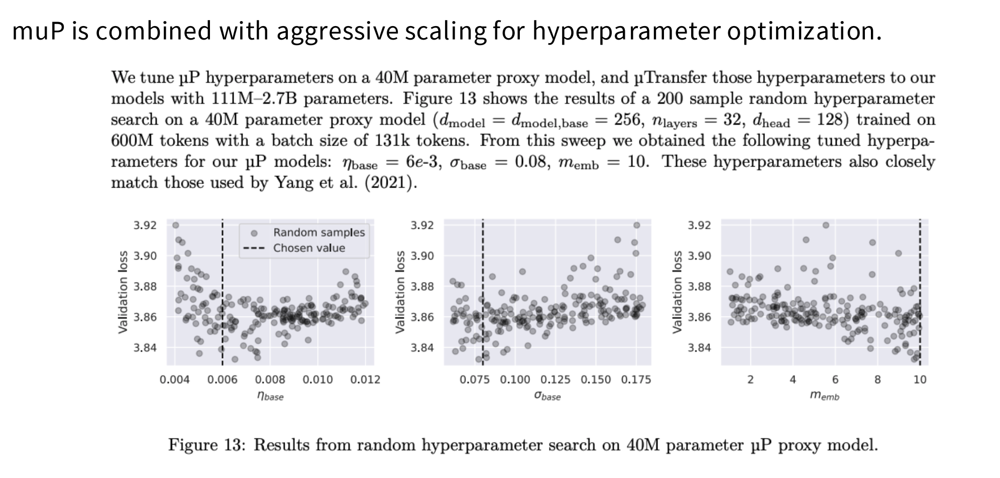

* **代理模型**：他们使用了一个**40M参数**的$\mu$P代理模型。这个模型相对较小，因此超参数搜索的计算成本较低。
* **搜索过程**：他们在这个小模型上进行了**200次随机超参数搜索**。这是一种常用的超参数调优方法，通过随机尝试不同的参数组合来寻找最优解。
* **搜索结果**：通过这次搜索，他们得到了三个关键的超参数值：
    * $\eta_{base}$（基础学习率）= **6e-3** (0.006)
    * $\sigma_{base}$（基础初始化标准差）= **0.08**
    * $m_{emb}$（嵌入乘数）= **10**
* **验证**：他们还提到，这些找到的超参数与Yang et al. (2021) 论文中使用的值非常接近，这说明了他们的方法是可靠的。




## MiniCPM
**$\mu$P（最大更新参数化）** 技术的进一步延伸，它详细列出了应用该技术来稳定模型扩展时所需的具体操作。
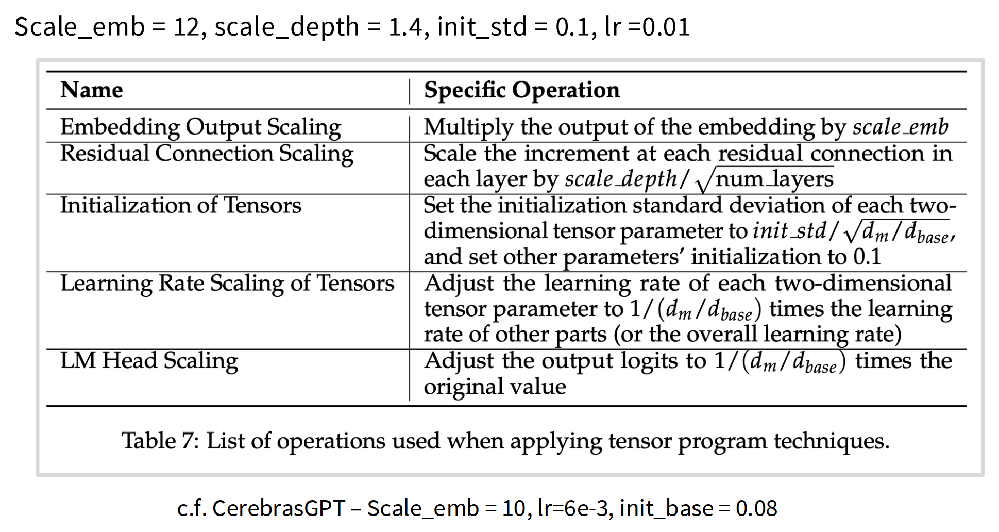
这张图表的核心是 **“张量程序技术（Tensor Program Techniques）”**，它将$\mu$P的理论转化为了一系列可执行的、针对不同模型部分的具体操作。

---

### 表格内容解析

表格列出了在使用 $\mu$P 时，需要对模型结构进行调整的五个关键操作：

1. **Embedding Output Scaling（嵌入层输出缩放）**
    * **操作**：将嵌入层的输出乘以一个缩放因子 `scale_emb`。
    * **目的**：确保嵌入层的输出信号强度在不同模型大小下保持一致，防止信息在网络深层传递时衰减或过度放大。

2. **Residual Connection Scaling（残差连接缩放）**
    * **操作**：对每个残差连接的增量部分进行缩放，缩放因子为 `scale_depth / sqrt(num_layers)`。
    * **目的**：残差连接是深度神经网络训练稳定的关键。这个操作确保了随着模型层数增加，信息流能够稳定地通过残差路径传播，避免梯度消失或爆炸。

3. **Initialization of Tensors（张量初始化）**
    * **操作**：将所有二维张量（例如全连接层和注意力层的权重矩阵）的初始化标准差设置为 `init_std / sqrt(d_m / d_base)`，并将其他参数的初始化设置为 0.1。
    * **目的**：这是 $\mu$P 的核心操作之一。它根据模型的宽度（$d_m$）进行动态调整，确保每一层的初始更新幅度保持在一个稳定、合理的范围内，从而为整个训练过程打下良好的基础。

4. **Learning Rate Scaling of Tensors（张量学习率缩放）**
    * **操作**：将所有二维张量学习率调整为 `1 / (d_m / d_base)` 乘以其他部分（或整体）的学习率。
    * **目的**：这同样是 $\mu$P 的核心。它根据模型宽度动态调整学习率，确保在模型扩展时，更新步长不会过度，从而保持训练的稳定性，这解释了为什么**最优学习率**可以保持不变。

5. **LM Head Scaling（语言模型头缩放）**
    * **操作**：将输出 logits（最终预测结果）调整为 `1 / (d_m / d_base)` 乘以原始值。
    * **目的**：确保模型输出层的信号强度也符合整体的缩放规律，与网络内部的动态保持一致。


### 最终输出的参数
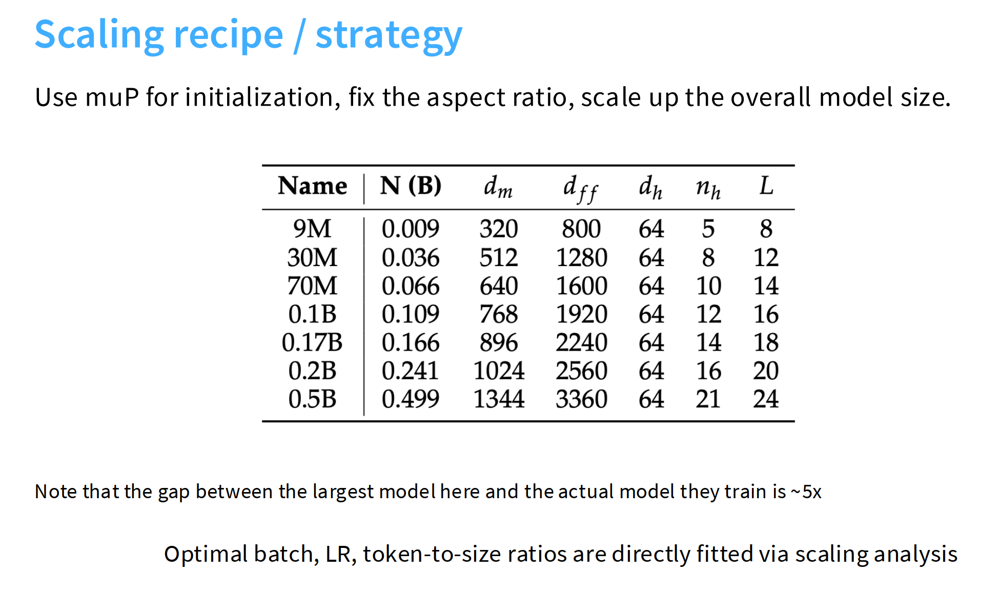


表格列出了一系列不同大小的模型，并展示了它们在扩展过程中，各个关键参数是如何变化的。

* **Name (名称)**：模型的大小，从 9M（9百万）到 0.5B（5亿）。
* **N (B) (参数数量)**：模型的总参数量，单位为十亿（Billion）。这个列与“Name”列对应，但提供了更精确的数值。
* **$d_m$ (模型维度)**：模型的隐藏层维度（或宽度），它随着模型增大而增加。
* **$d_{ff}$ (前馈网络维度)**：前馈网络（FFN）的维度，它也随着模型增大而增加。
* **$d_h$ (头维度)**：多头注意力机制中每个头的维度。我们可以看到，**这个值始终保持为 64**。这是“**固定长宽比**”策略的一个具体体现，表明在扩展过程中，某些关键维度是保持不变的。
* **$n_h$ (头数量)**：多头注意力机制中头的数量，它随着模型增大而增加。
* **L (层数)**：模型的层数，也随着模型增大而增加。

---

### 关键结论

这张图表传达了几个重要的实践经验：

1.  **分步扩展**：图表展示了一个渐进式的扩展过程，从一个非常小的 9M 模型开始，逐步增加到 5 亿参数。这与之前提到的**先在小模型上进行超参数搜索**的策略相呼应，提供了具体的模型尺寸参考。

2.  **固定长宽比**：图中的 $d_h$ 保持不变（始终为 64），这意味着在扩展时，模型的某些结构性特征被固定住了。这种做法有助于简化设计和训练过程，并确保模型在不同大小下能够保持相似的计算效率和信息流模式。

3.  **其他参数的直接拟合**：幻灯片底部提到，“Optimal batch, LR, token-to-size ratios are directly fitted via scaling analysis.”（**最优的批次大小、学习率和 token-模型尺寸比率可以直接通过扩展分析来拟合。**） 这意味着，一旦你确定了扩展规律（如表格所示），其他重要的训练超参数（如批次大小和学习率）也可以根据这个规律进行预测和设置，而无需进行耗时的重新搜索。

### optimal batch
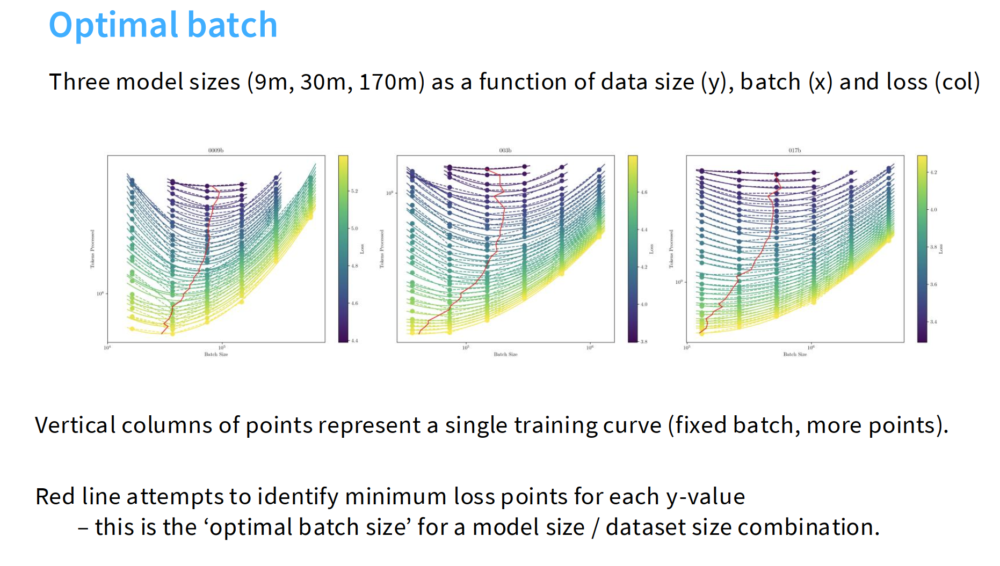
这张图片展示了在不同模型大小下，**最优批次大小（Optimal batch size）**是如何与数据量和训练损失相关的。它通过三张热力图，对比了三种不同规模的模型（9M, 30M, 170M），来探索这三者之间的关系。

#### 图表内容解析

* **横轴**：**批次大小（Batch Size）**，它以对数尺度（$10^1$ 到 $10^5$）表示。
* **纵轴**：**训练数据量（Training Processed）**，同样以对数尺度表示，代表模型已经处理过的 token 数量。
* **颜色**：代表训练损失（**Loss**），颜色越深（偏紫色），损失越高；颜色越浅（偏黄色），损失越低。

每张图中的点阵代表了一系列实验结果。

* **垂直的点柱**：代表一条**完整的训练曲线**。即在固定批次大小的情况下，模型损失随训练数据量增加而下降的过程。这些点柱从顶部到底部，颜色从深到浅，说明随着训练数据量的增加，模型性能在提升，损失在下降。
* **红线**：连接了每个垂直点柱中损失最低的点，也就是**最低损失点**。这条红线代表了在不同数据量下，模型能够达到的最佳损失。

#### 核心结论

这张图片的核心在于红线的走向。这条红线试图找到在**每一种数据量**下，**哪一个批次大小能达到最低的损失**。

* **红线向右下角移动**：三张图中的红线都呈现出向右下角移动的趋势。这意味着，随着**训练数据量（纵轴）**的增加，达到最优损失所需的**批次大小（横轴）**也在增加。
* **模型大小的影响**：对比三张图（9M, 30M, 170M），可以发现，模型越大（从左到右），红线向右移动的趋势越明显。这表明，**更大的模型**在处理更多数据时，需要**更大的批次大小**才能达到最优性能。

#### 最终可拟合的结果
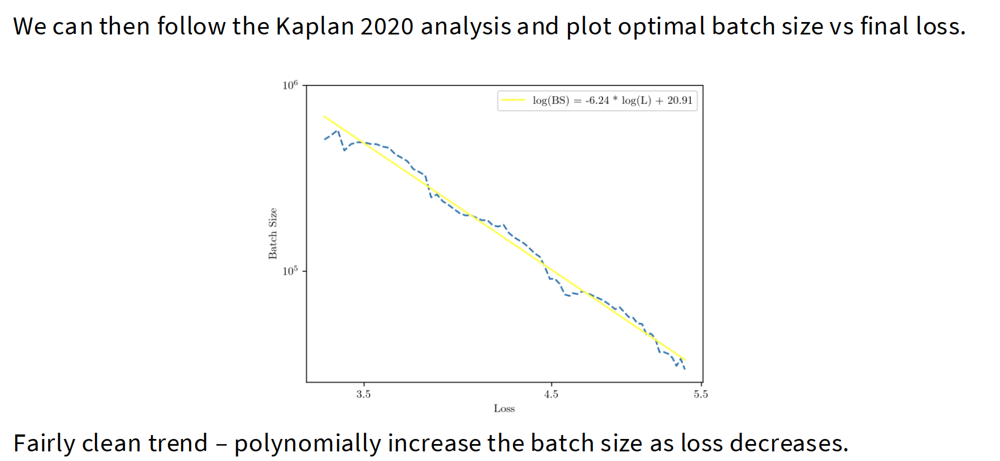

### Optimal LR
既然运用了$/mu P$那么就可以证实最优学习率在模型大小变化的情况下仍然适用
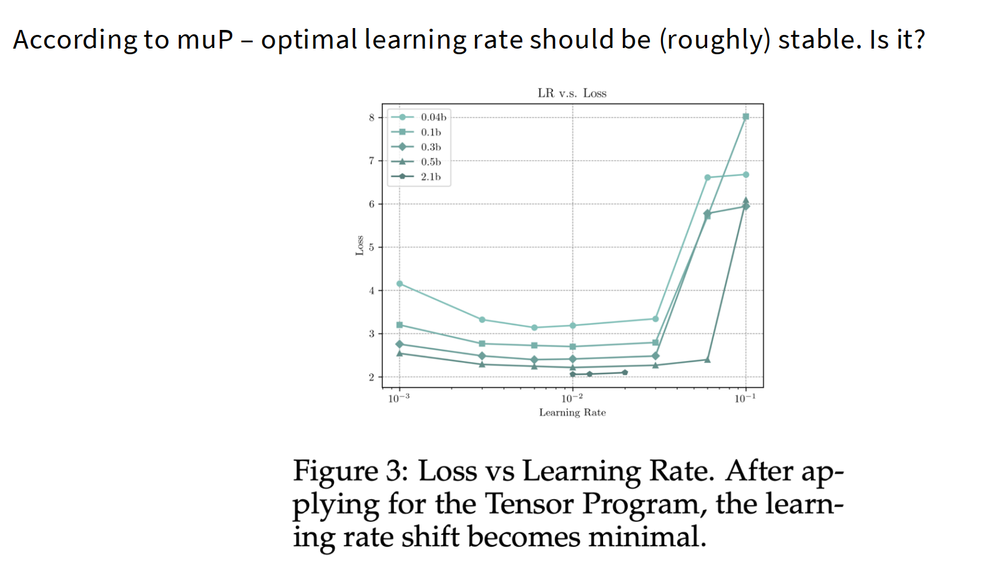

### model size vs data tradeoffs
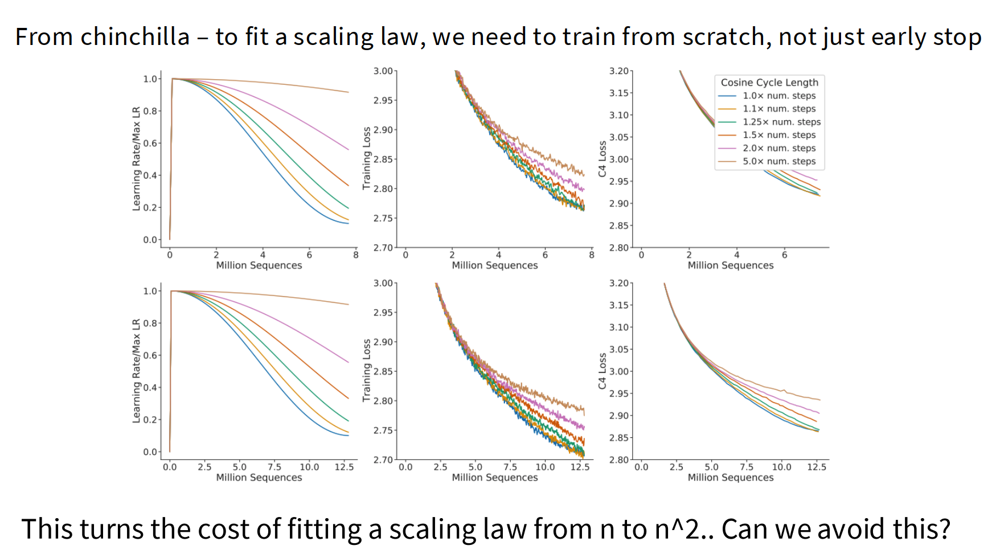

### WSD learning rate
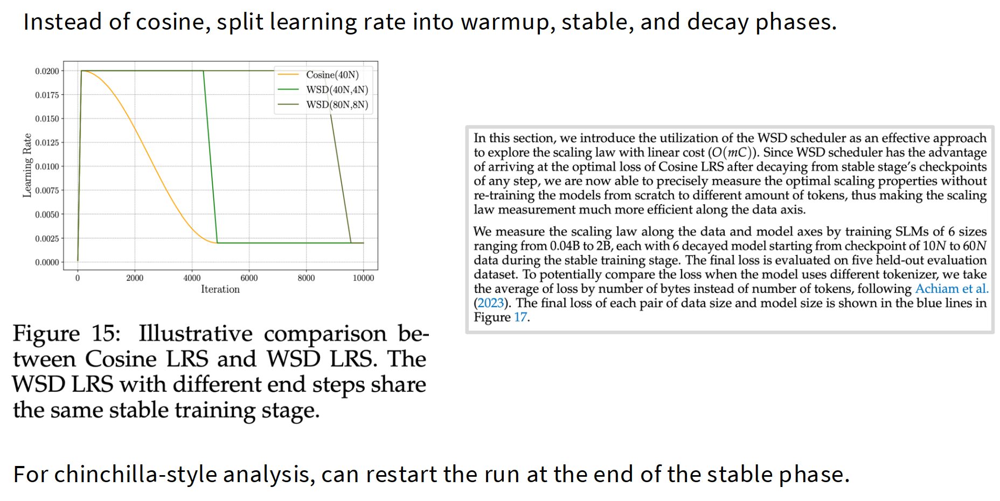
这张幻灯片介绍了一种新的学习率调度器（Learning Rate Scheduler），名为 **WSD (Warmup, Stable, Decay) LRS**，并将其与传统的 **Cosine LRS (余弦学习率调度器)** 进行了对比。

#### 核心观点

**WSD LRS** 将学习率的生命周期分成了三个阶段：**预热（warmup）、稳定（stable）和衰减（decay）**。这种方法的主要优势在于，它使得**扩展分析（scaling analysis）**变得更加高效和精确。

---

#### 图表解释

* **横轴**：**迭代次数（Iteration）**，代表训练的步数。
* **纵轴**：**学习率（Learning Rate）**。

图中有三条曲线：

1.  **黄色曲线（Cosine LRS）**：这是标准的余弦学习率调度器。学习率从高点开始，平滑地衰减到底部，其形状类似于余弦函数的一部分。

2.  **两条绿色曲线（WSD LRS）**：这是 WSD 学习率调度器。
    * **预热（Warmup）阶段**：学习率从 0 或很小的值迅速上升到最大值。
    * **稳定（Stable）阶段**：学习率保持在一个较高的恒定值，持续一段时间。这正是 WSD 调度器的核心特征。
    * **衰减（Decay）阶段**：在稳定阶段结束后，学习率迅速衰减到接近 0。

WSD 的两条绿色曲线展示了不同总训练步数（即不同的结束点）下的情况，但它们都具有相同的稳定训练阶段。

---

### 文段解释

文段对 WSD 调度器的优势做了更详细的说明：

1.  **扩展分析效率**：文段指出，WSD 调度器是一种探索**扩展规律**的有效方法。由于它有一个稳定的训练阶段，研究者可以在这个稳定阶段的**检查点（checkpoint）**处，直接对模型进行度量。
2.  **无需从头训练**：传统方法可能需要从头开始训练多个模型，以测量不同数据量下的扩展规律。而 WSD 允许在稳定阶段的任何检查点处进行度量，这意味着研究者**无需从零开始重新训练模型**，就能测量不同数据量下的性能，从而大大提高了效率。
3.  **类 Chinchilla 分析**：幻灯片底部提到，对于**类 Chinchilla 的分析**（一种用于确定模型大小和训练数据量最优比例的方法），可以在稳定阶段结束时重新启动训练，以探索不同的数据量。这表明 WSD 调度器非常适合用于进行这种需要大量实验的扩展研究。

### 总结

这张图片的核心观点是：**通过使用 WSD 学习率调度器，我们可以更高效地进行模型扩展分析。**

它的优势在于：
* **拥有一个稳定的学习率阶段**，允许研究者在不影响训练动态的情况下，在不同检查点进行度量。
* **避免重复训练**，节省了大量的计算资源和时间，使得探索大规模模型的扩展规律变得更加可行。

#### 实践结果（效果很好）
在最后的衰减阶段，模型的loss值迅速下降
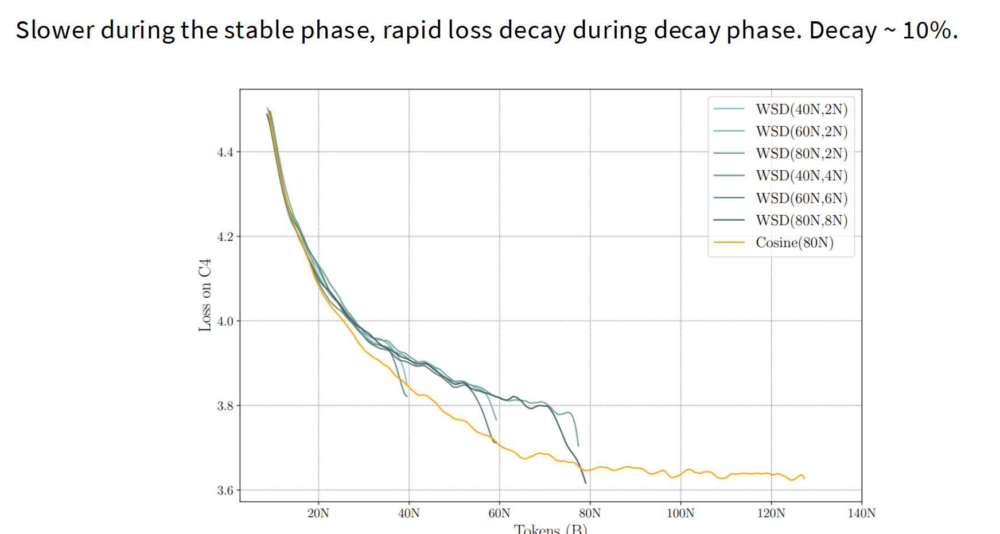


### 过拟合带来的损失惩罚是稳定的。
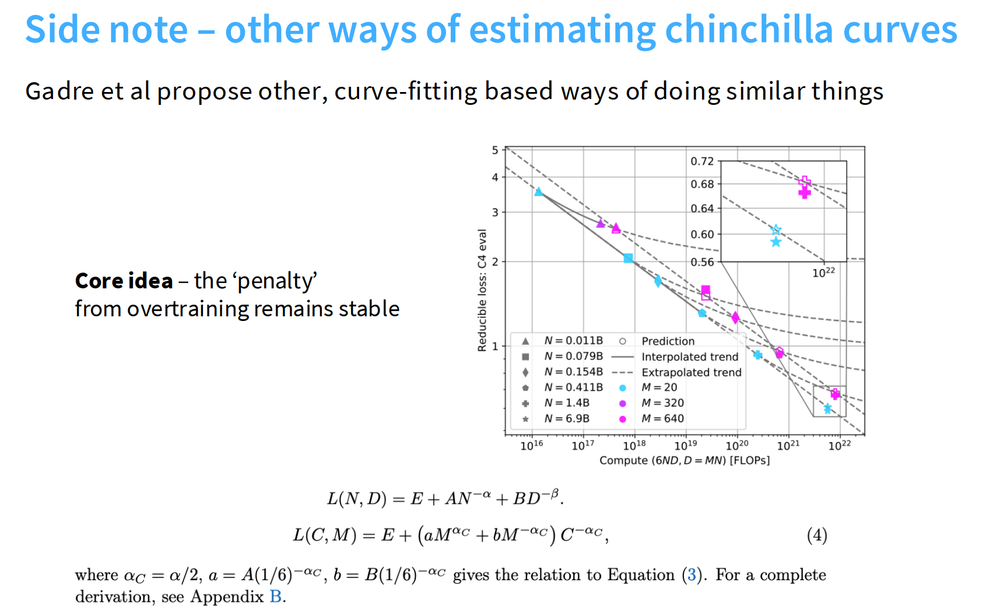
方法：通过将损失建模为参数和数据量的函数，并进行曲线拟合，可以在不需要从头开始训练所有模型的情况下，有效地预测最优模型尺寸和训练数据量的组合。

#### 应用该实验结果
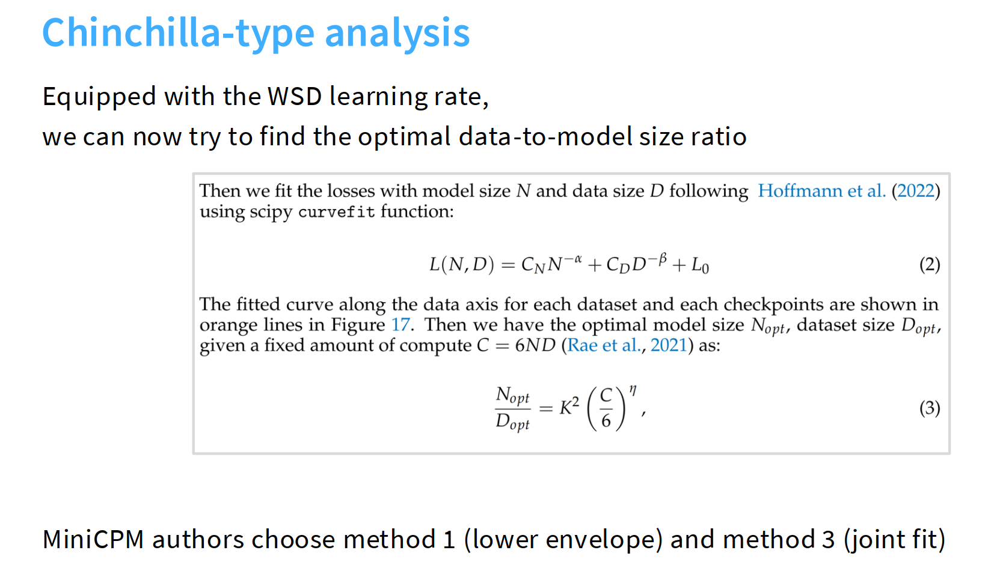
---


1.  **拟合损失函数**：
    * **公式 (2)**：$L(N,D) = C_N N^{-\alpha} + C_D D^{-\beta} + L_0$
    * 这个公式描述了**损失 ($L$)** 如何与**模型尺寸 ($N$)** 和**训练数据量 ($D$)** 相关。
    * **$N^{-\alpha}$**：代表了模型尺寸对损失的贡献。当模型变大时，这项损失会减小。
    * **$D^{-\beta}$**：代表了数据量对损失的贡献。当数据量增加时，这项损失也会减小。
    * **$L_0$**：是**不可还原的损失**，即无论模型多大、数据多少，都无法消除的损失下限。
    * 作者们使用 `scipy.curvefit` 函数来拟合实验数据，从而得到这个公式中的参数 ($\alpha, \beta, C_N, C_D, L_0$)。

2.  **寻找最优比例**：
    * **公式 (3)**：$\frac{N_{opt}}{D_{opt}} = K^2 \left(\frac{C}{6}\right)^{\eta}$
    * 这个公式给出了在**固定计算量 ($C$)** 下，**最优模型尺寸 ($N_{opt}$) 与最优数据量 ($D_{opt}$) 的比值**。
    * 这个公式的推导是基于**扩展定律（scaling law）**的理论。它表明，为了最有效地利用给定的计算资源，模型尺寸和数据量之间存在一个最佳的“平衡点”。


* **MiniCPM 的选择**：底部提到，MiniCPM 的作者选择了两种方法：
    * **Method 1 (lower envelope)**：寻找在给定计算量下，能够达到最低损失的模型和数据组合。
    * **Method 3 (joint fit)**：同时拟合模型尺寸和数据量，以找到一个统一的损失函数来描述所有实验数据。



#### method 1
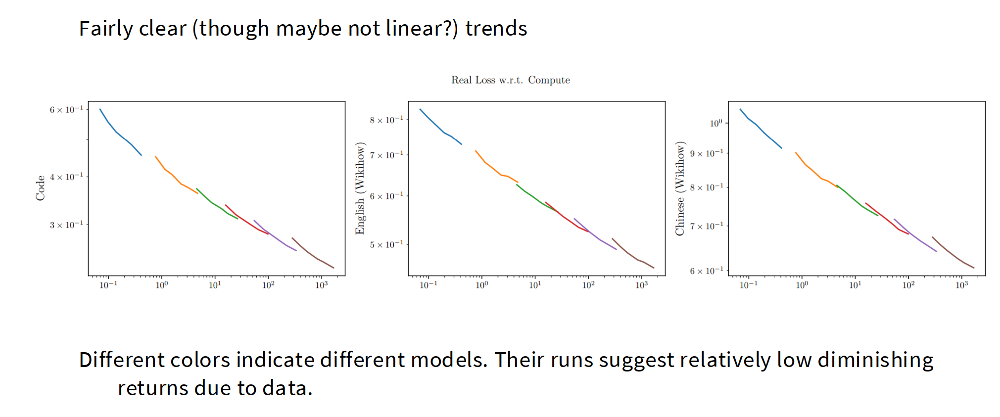

#### method 3
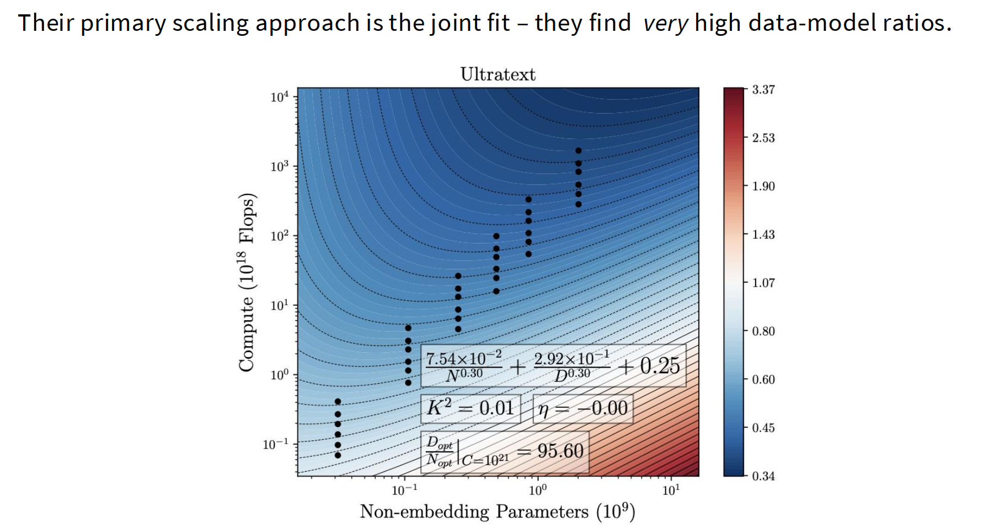
但是用method 3得到的ratio非常高：overall data-to-model ratio is very high (192)

**从两张幻灯片中得到的经验：data-to-model ratio并不仅仅局限在20左右，可以放心的显著提高token/参数比例**


### 最终实验结果
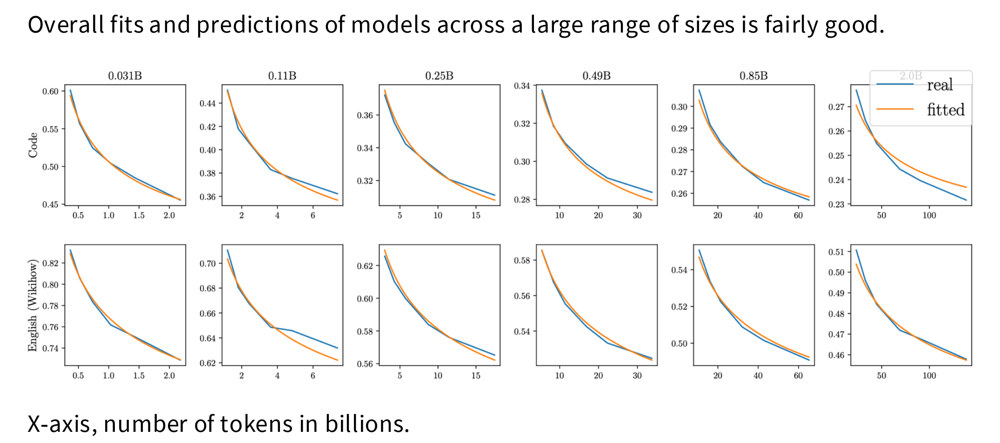

## Deepseek
### Scaling strategy – batch + LR
<mark>scaling strategy:don't use any muP,directly estimate optimal batch/LR</mark>
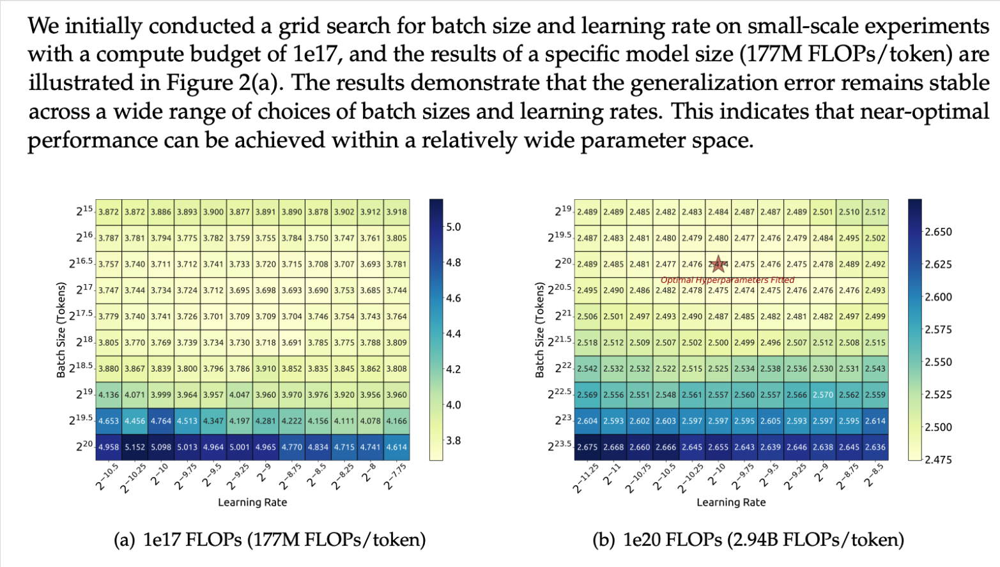
在不同计算预算下，**批量大小（batch size）和学习率（learning rate）**对模型性能影响的**网格搜索**结果热力图。

幻灯片的核心结论是：**在相对较宽的参数空间内，可以实现接近最优的性能，模型的泛化误差（generalization error）保持稳定。**


#### **图 (a): 1e17 FLOPs 计算预算**

* **模型大小**：177M FLOPs/token。这是一个相对较小的模型。
* **热力图**：可以看到，在图的中心区域，颜色相对较浅，数值较低，表明损失较低。随着学习率和批量大小偏离这个中心区域，损失值开始升高，颜色变深。
* **结论**：这张图显示了在有限的计算预算下，存在一个**相对集中的最优参数区域**，但这个区域的损失值变化还是比较明显的，从最低的 3.738 到最高的 5.0，这表明参数选择对性能有显著影响。

#### **图 (b): 1e20 FLOPs 计算预算**

* **模型大小**：2.94B FLOPs/token。这是一个更大的模型，计算预算也更高。
* **热力图**：与左图相比，这张图的颜色分布更加均匀，尤其是中心的绿色区域非常宽广。这表明，**在非常宽的学习率和批量大小范围内，模型的损失都非常低且稳定**。
* **红星**：图中的红星标记了“**Optimal hyperparameters fitted**”（拟合的最优超参数）。这个点位于一个非常平坦的低损失区域，再次印证了在更大规模的训练中，超参数选择的鲁棒性。
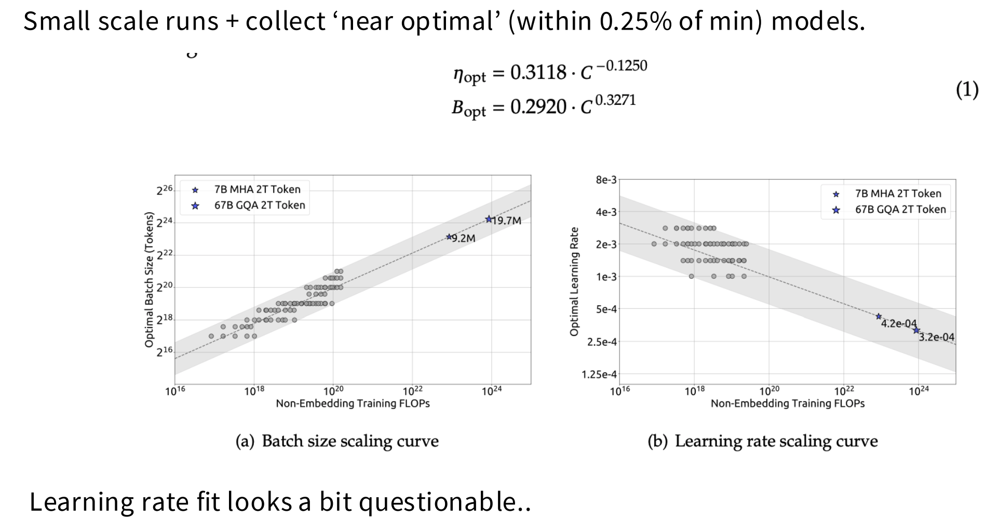
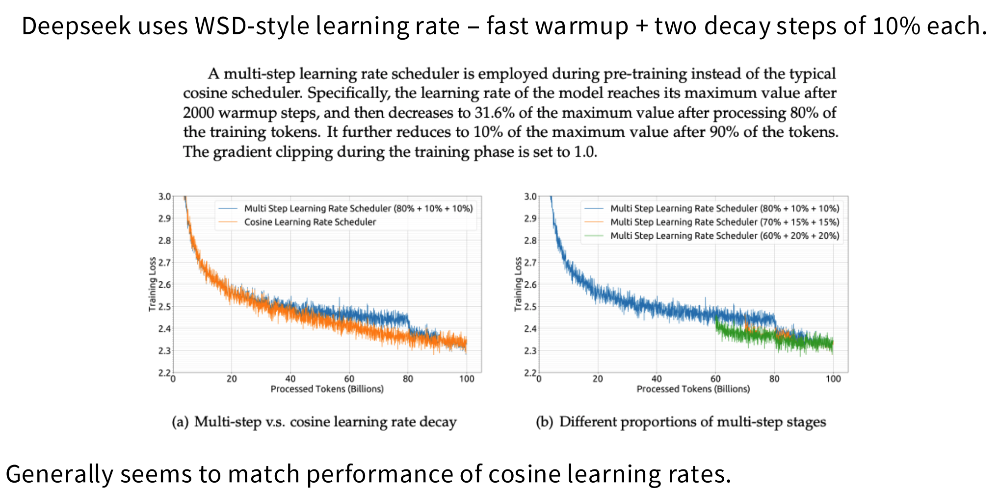

### data size tradeoff:一般比超参数的学习更容易找出规律 
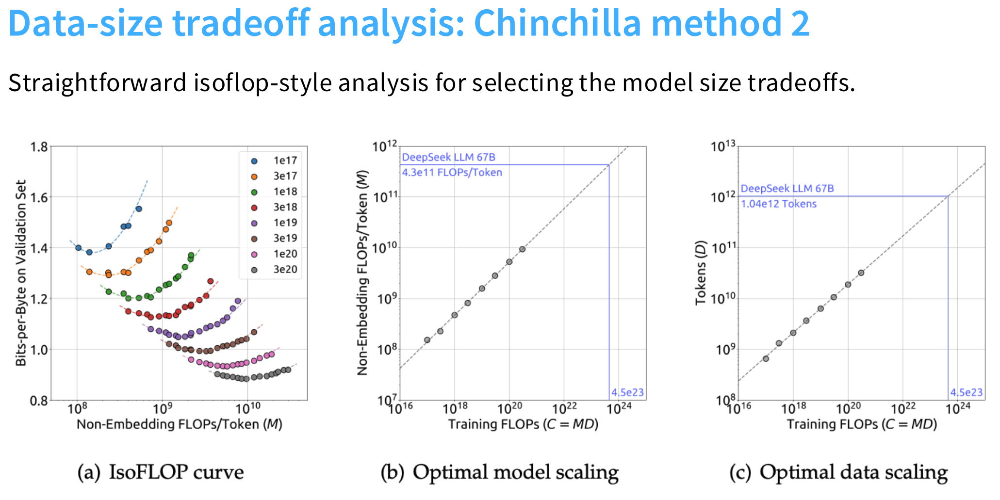

#### 最终结果
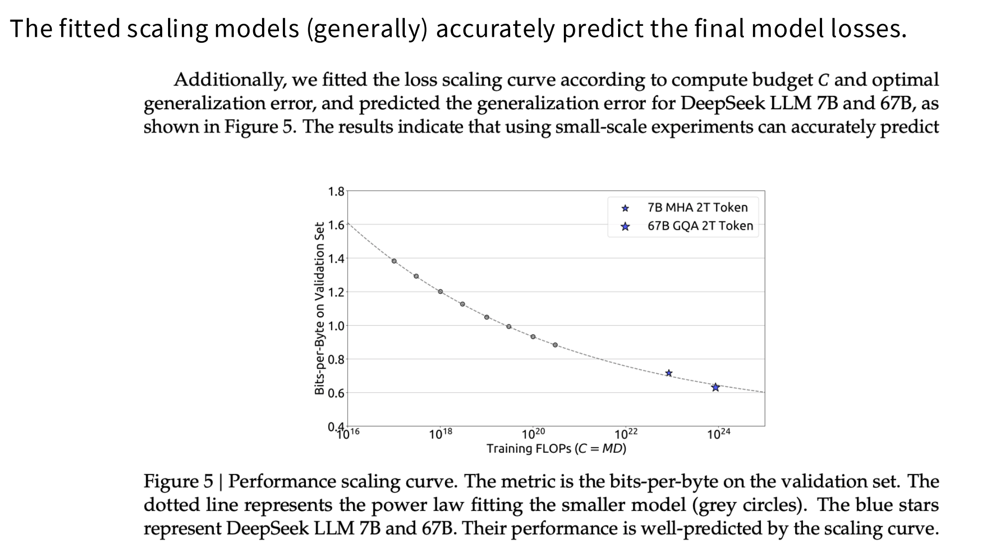


## LLAMA 3
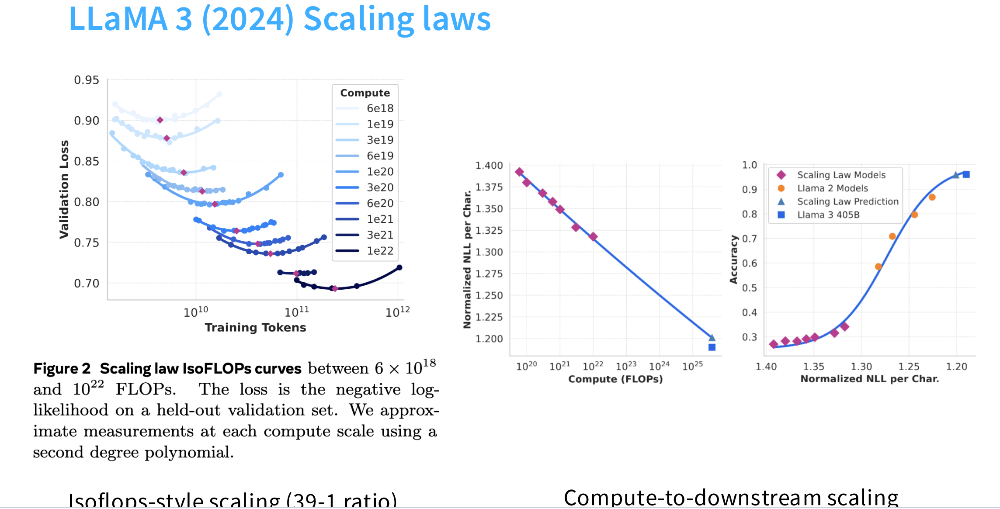
存在最优的数据-模型尺寸比例：在固定计算预算下，存在一个最佳的训练数据量，可以达到最低的损失。

计算量决定了性能上限：模型的性能与计算量之间存在可预测的扩展规律。

训练损失与实际应用性能相关：通过降低训练损失，可以有效提高模型在下游任务上的精度。

## 混元模型
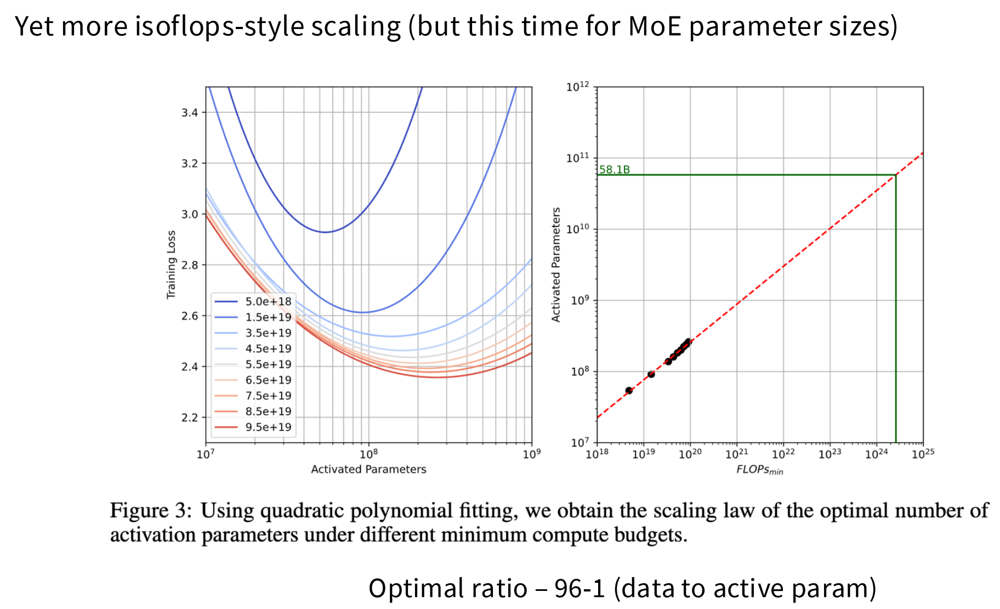
根据实验，ratio达到了96/1,是因为模型框架的影响

### minimax 1
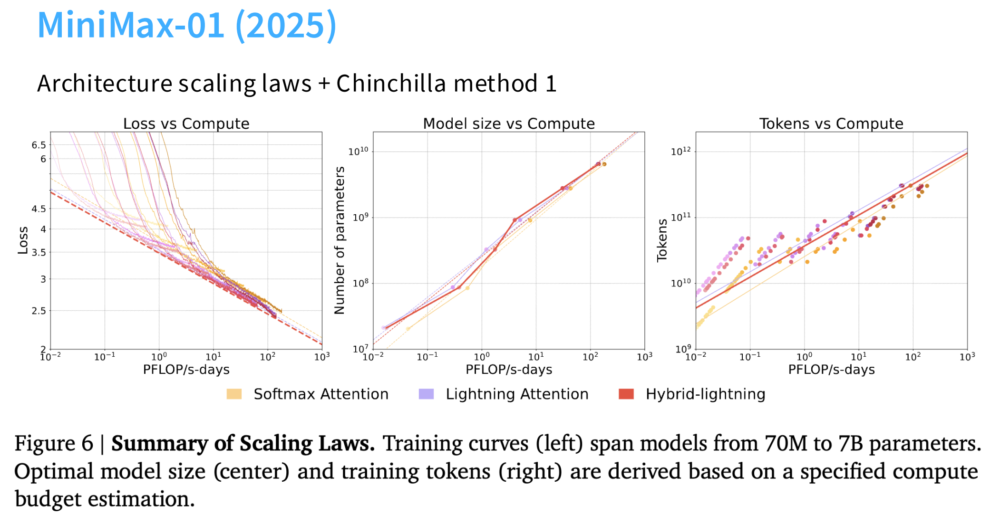
**在模型扩展时，不同注意力机制对性能的影响很小。 无论采用哪种注意力架构（Softmax, Lightning, 或 Hybrid-lightning），模型尺寸和训练 token 数量与计算量之间的最优比例关系是基本相同的。**

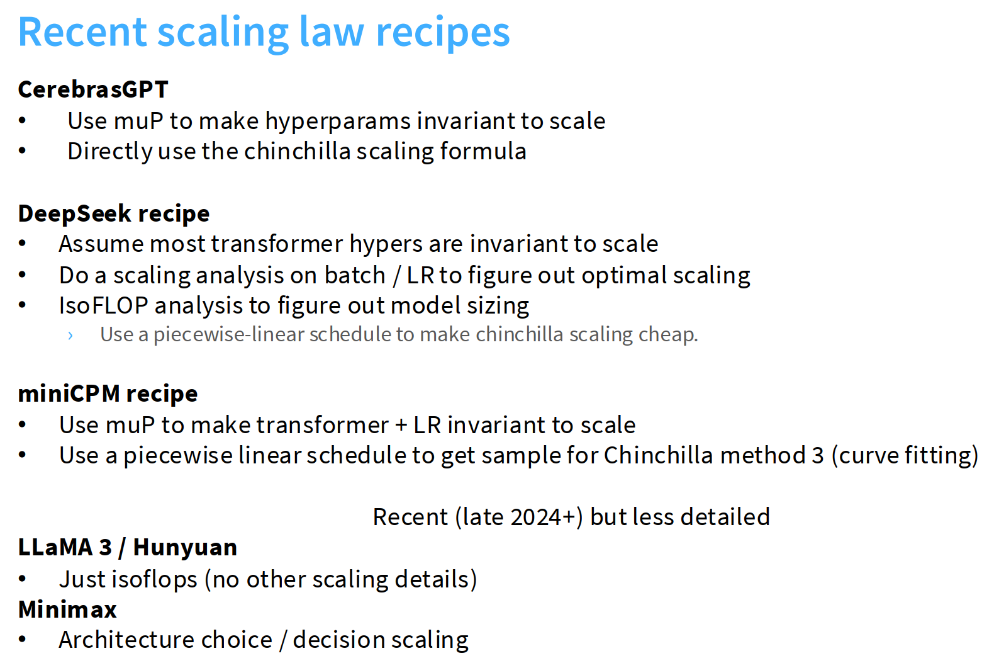

# $muP$的背后原理

A1：初始化时，激活值是 Θ(1) 级别。

这意味着无论你将网络宽度设置为 100 还是 10000，初始化时各层的激活值都将保持在一个固定范围内（例如 0.5 到 2.0 之间），不会随着网络变宽而指数级增长。这有效防止了梯度爆炸。

A2：一次梯度更新后，激活值的变化量是 Θ(1) 级别。

这意味着无论网络有多宽，一次梯度更新对激活值造成的影响都是一个可控的、有限的量。它不会随着网络变宽而变得越来越大，从而保证了训练过程的稳定性。

好的，这是对您提供的关于μP（Maximal Update Parametrization，最大更新参数化）的PDF文档的全面中文解释。

### **第一部分：μP的核心思想与理论推导**

**1. [cite_start]μP是什么？ [cite: 1]**
[cite_start]μP是一种为神经网络（特别是大型语言模型）设计的参数化方法。它的核心目标是：当网络宽度（即神经元数量）增加时，模型的最佳超参数（尤其是学习率）能够保持不变，从而可以直接从小型模型的调优结果“迁移”到大型模型上，极大地节省了训练大型模型的成本 [cite: 62, 78]。

**2. [cite_start]μP的基本断言**
μP基于两个关键的断言，这两个断言都与网络宽度 $n_l$ (第 $l$ 层的宽度) 相关：
* [cite_start]**A1：初始化时，激活值应保持在 $\Theta(1)$ 级别**：这意味着无论网络多宽，在训练开始时，每一层输出的激活值大小应该保持稳定，不应随宽度爆炸或消失 [cite: 8]。
* [cite_start]**A2：经过一步梯度更新后，激活值的变化量也应保持在 $\Theta(1)$ 级别**：这确保了在训练初期，权重的更新对激活值的影响是稳定的，同样不会随宽度发生剧烈变化 [cite: 9]。

**3. [cite_start]理论推导概要 **
文档的第2到第4页通过一个深度线性网络的例子，推导了如何实现上述两个条件：
* [cite_start]**为了满足A1（稳定初始化）**：需要精心设计权重矩阵的初始化方差。具体来说，初始化的标准差 $\sigma$ 应该与输入层宽度 $n_{l-1}$ 的平方根成反比，即 $\Theta(\frac{1}{\sqrt{n_{l-1}}})$ [cite: 14, 42]。
* [cite_start]**为了满足A2（稳定更新）**：需要让学习率 $\eta_l$ 随着层宽度的变化而缩放。推导得出，对于SGD优化器，学习率应该设置为 $\Theta(\frac{n_{l}}{n_{l-1}})$，即与输出宽度和输入宽度的比率成正比 [cite: 38, 42]。

**4. [cite_start]μP与标准参数化 (SP) 的对比 **
* **标准参数化 (SP)**：
    * [cite_start]**初始化**：方差通常设置为 $\frac{1}{n_{l-1}}$ (即标准差为 $\frac{1}{\sqrt{n_{l-1}}}$) [cite: 45, 46]。
    * [cite_start]**学习率**：通常设置为一个固定的常量，不随模型宽度的变化而调整 [cite: 47]。
* **μP**：
    * [cite_start]**初始化**：方差设置更为复杂，同时考虑了输入和输出的宽度 [cite: 42]。
    * [cite_start]**学习率**：学习率需要根据层宽度的比例进行缩放，而不是一个固定的值 [cite: 42]。

### **第二部分：μP在Transformer模型中的应用与实现**

文档的第6页和第7页展示了μP在具体模型（如Cerebras GPT和标准Transformer）中的实现细节，通过表格对比了SP和μP的差异。

* [cite_start]**权重初始化**：对于不同的权重矩阵（如QKV权重、FFN权重），μP的初始化方差通常会除以一个宽度乘数 $m_{width}$ [cite: 56]。
* [cite_start]**学习率**：μP会为不同的层（如QKV、FFN的权重）设置不同的学习率，通常也会除以宽度乘数 $m_{width}$ [cite: 56]。
* [cite_start]**Attention缩放**：标准Transformer的Attention缩放因子是 $\frac{1}{\sqrt{d_{head}}}$ (头维度)，而μP建议使用 $\frac{1}{d_{head}}$ [cite: 69]。
* [cite_start]**输出Logits**：μP在最后输出logits时，会将其除以宽度乘数 $m_{width}$ [cite: 56]。

[cite_start]该研究的一个重要局限是，它主要关注**宽度缩放**，即模型的深度L和注意力头的维度D保持不变，只有模型的隐藏层宽度M在变化 [cite: 73, 75, 76]。

### **第三部分：μP的有效性与鲁棒性实验 **

这部分通过大量实验来验证μP是否有效，以及它在何种情况下会失效。

**1. μP的核心优势：学习率的稳定迁移**
[cite_start]实验结果（第9页的表格）有力地证明了μP的有效性。对于不同宽度（128, 512, 2048）的模型，使用μP参数化后，它们的最佳基础学习率都稳定在 $2^{-6}$ 附近 [cite: 79, 80][cite_start]。这意味着研究人员可以在一个非常小的模型上找到最佳学习率，然后直接将它用于比它大16倍甚至更大的模型上，而不需要重新搜索 [cite: 81]。

**2. μP的鲁棒性：在哪些情况下依然有效？**
[cite_start]现代语言模型中有很多组件偏离了μP的理论基础，但实验表明μP对其中很多是鲁棒的 [cite: 83]。
* [cite_start]**激活函数**：对于SwiGLU、Squared ReLU等非线性激活函数，μP依然能保持学习率的稳定迁移 [cite: 95]。
* [cite_start]**批量大小 (Batch Size)**：无论是增大4倍还是减小4倍的批量大小，μP的表现依然稳定 [cite: 96]。
* [cite_start]**初始化变体**：即使采用一些特殊的初始化方法（如SP Unembedding Init, Zero Query Init），μP仍然有效 [cite: 97, 98]。

**3. μP的脆弱性：在哪些情况下会失效？**
实验也发现了μP并非万能的，在以下几种情况下，其学习率稳定迁移的特性会遭到破坏：
* [cite_start]**RMSNorm中的可学习增益 (Learnable Gains)**：如果在RMSNorm层中使用可学习的缩放增益，μP的迁移能力会失效 [cite: 99, 100][cite_start]。不过好消息是，移除这些增益对模型性能影响不大 [cite: 101]。
* [cite_start]**奇特的优化器 (Exotic Optimizers)**：对于像Lion这样不依赖二阶矩的优化器，μP会失效 [cite: 102, 103]。
* [cite_start]**强权重衰减 (Strong Weight Decay)**：当使用较大的权重衰减值（例如0.1）时，μP的稳定性会被破坏，这被认为是μP的一个显著失败案例 [cite: 104, 105]。

**4. 总体评价**
[cite_start]尽管存在一些限制，但μP总体上非常有用。与标准参数化（SP）相比，μP在模型宽度变化时表现得稳定得多 [cite: 106][cite_start]。SP模型的验证损失在宽度增加时变得非常不稳定，而μP则更容易调优 [cite: 107]。

